## Galaxy morphological image classification based on Galaxy Zoo dataset
This notebook uses Galaxy zoo dataset available on Kaggle at https://www.kaggle.com/c/galaxy-zoo-the-galaxy-challenge

The images are collected by Sloan Digital Sky Survey (SDSS)
Labels were provided by Galaxy Zoo citizen science project.

In [ ]:
#!pip uninstall tensorflow keras -y
!pip install tensorflow==2.16.1
!pip install keras==3.3.3

In [ ]:
# install graphviz
#!apt-get install graphviz -y
# install python interface
!pip install graphviz

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import seaborn as sns

## Make sure right TF and Keras are installed

In [ ]:
# print tensorflow version
print(tf.__version__)
# print keras version
print(tf.keras.__version__)

2.16.1
3.3.3


## Check existance of GPUs

In [ ]:
# Check TensorFlow's ability to see the GPU
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

# Get details on the detected devices
if tf.test.gpu_device_name():
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
    print("Please install GPU version of TF")

Num GPUs Available:  2
Default GPU Device: /device:GPU:0


In [ ]:
import os
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'

## Exploratory data analysis
### Check labels and print few images with their labels

In [ ]:
# EDA

# Load the dataset labels
df = pd.read_csv('/content/mlpa-final-project/training_solutions_rev1.csv')
# Let us do some EDA on this df

# Print the first 5 rows
print(df.head())

# Print the shape
print(df.shape)

# Print the datatypes
print(df.dtypes)

# Print the summary statistics
print(df.describe())

# Print the number of unique values
print(df['GalaxyID'].nunique())

# Print the unique values
print(df['GalaxyID'].unique())

# Print the number of missing values
print(df.isnull().sum())

# Print the number of duplicated rows
print(df.duplicated().sum())

   GalaxyID  Class1.1  Class1.2  Class1.3  Class2.1  Class2.2  Class3.1  \
0    100008  0.383147  0.616853  0.000000  0.000000  0.616853  0.038452   
1    100023  0.327001  0.663777  0.009222  0.031178  0.632599  0.467370   
2    100053  0.765717  0.177352  0.056931  0.000000  0.177352  0.000000   
3    100078  0.693377  0.238564  0.068059  0.000000  0.238564  0.109493   
4    100090  0.933839  0.000000  0.066161  0.000000  0.000000  0.000000   

   Class3.2  Class4.1  Class4.2  ...  Class9.3  Class10.1  Class10.2  \
0  0.578401  0.418398  0.198455  ...  0.000000   0.279952   0.138445   
1  0.165229  0.591328  0.041271  ...  0.018764   0.000000   0.131378   
2  0.177352  0.000000  0.177352  ...  0.000000   0.000000   0.000000   
3  0.129071  0.189098  0.049466  ...  0.000000   0.094549   0.000000   
4  0.000000  0.000000  0.000000  ...  0.000000   0.000000   0.000000   

   Class10.3  Class11.1  Class11.2  Class11.3  Class11.4  Class11.5  Class11.6  
0   0.000000   0.000000   0.092886 

In [ ]:
# print distribution of target classes
print(df.iloc[:, 1:].sum() / len(df))

Class1.1     0.432526
Class1.2     0.542261
Class1.3     0.025213
Class2.1     0.106408
Class2.2     0.435854
Class3.1     0.102526
Class3.2     0.333328
Class4.1     0.215629
Class4.2     0.220224
Class5.1     0.040842
Class5.2     0.180468
Class5.3     0.177904
Class5.4     0.036639
Class6.1     0.231807
Class6.2     0.768193
Class7.1     0.170021
Class7.2     0.207765
Class7.3     0.054740
Class8.1     0.034812
Class8.2     0.013449
Class8.3     0.032807
Class8.4     0.040044
Class8.5     0.064546
Class8.6     0.042307
Class8.7     0.003842
Class9.1     0.063014
Class9.2     0.010614
Class9.3     0.032780
Class10.1    0.091801
Class10.2    0.083969
Class10.3    0.039859
Class11.1    0.015411
Class11.2    0.094338
Class11.3    0.017587
Class11.4    0.007603
Class11.5    0.007006
Class11.6    0.073683
dtype: float64


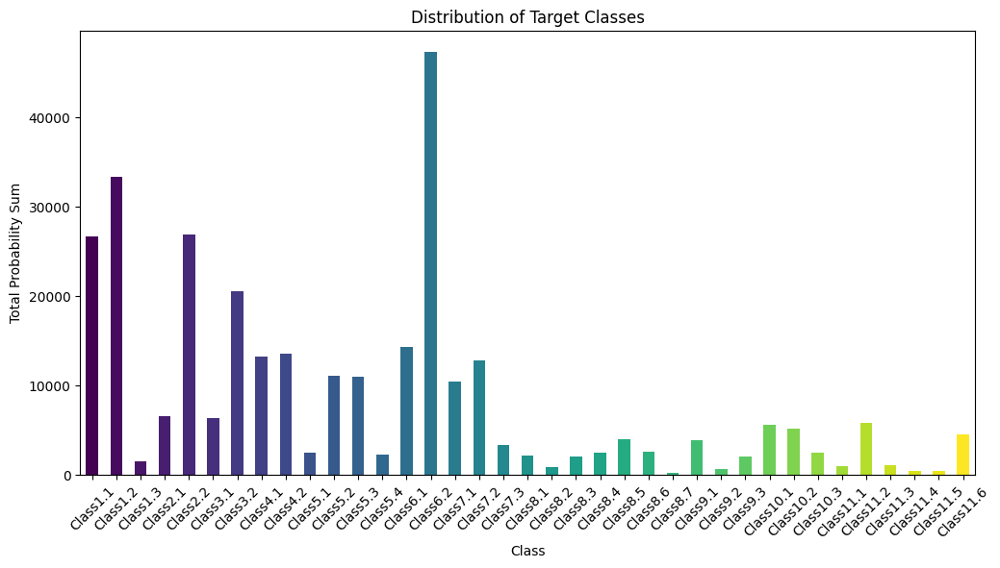

In [ ]:
# Plot the distribution of target classes
# Summing up the probabilities for each class
class_sums = df.iloc[:, 1:].sum()

# Generating a color map
colors = plt.cm.viridis(np.linspace(0, 1, len(class_sums)))

# Plotting
plt.figure(figsize=(12, 6))
class_sums.plot(kind='bar', color=colors)
plt.title('Distribution of Target Classes')
plt.xlabel('Class')
plt.ylabel('Total Probability Sum')
plt.xticks(rotation=45)
plt.show()

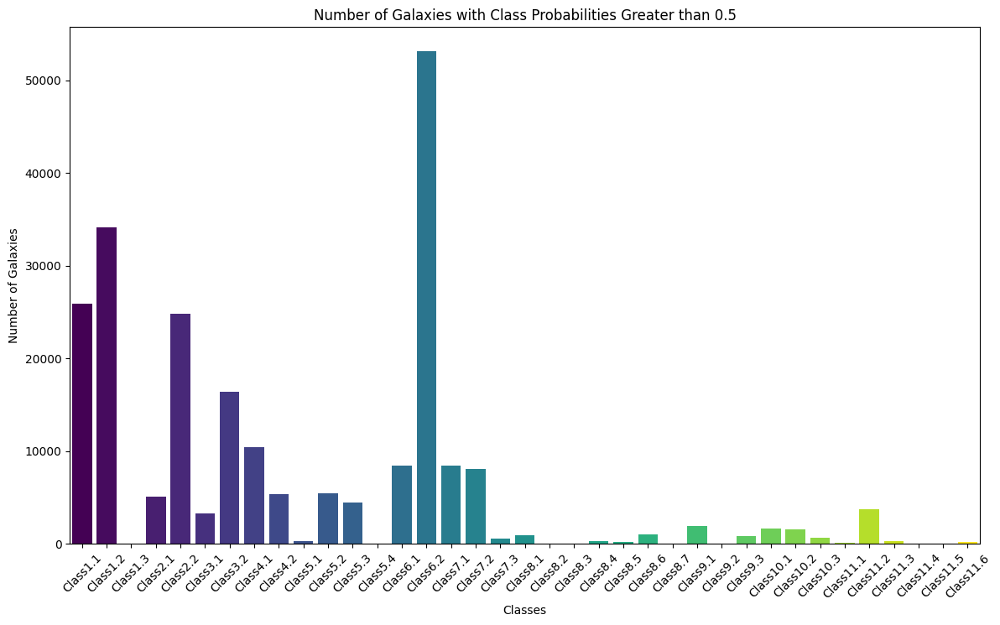

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Filter the DataFrame to include only probabilities greater than 0.5
filtered_df = df.drop(columns=['GalaxyID']) > 0.5

# Sum these results to get the number of galaxies exceeding the threshold per class
class_counts = filtered_df.sum()

# Filter out any classes that never exceed the threshold (if necessary)
class_counts = class_counts[class_counts > 0]

# Plotting
plt.figure(figsize=(14, 8))
colors = plt.cm.viridis(np.linspace(0, 1, len(class_counts)))
bars = plt.bar(class_counts.index, class_counts.values, color=colors)

plt.title('Number of Galaxies with Class Probabilities Greater than 0.5')
plt.ylabel('Number of Galaxies')
plt.xlabel('Classes')
plt.xticks(rotation=45)

# Adjust the x-axis limits to give some padding on both sides
plt.xlim(-0.5, len(class_counts.index) - 0.5)  # Adjusting this to ensure the first bar is fully shown

plt.show()

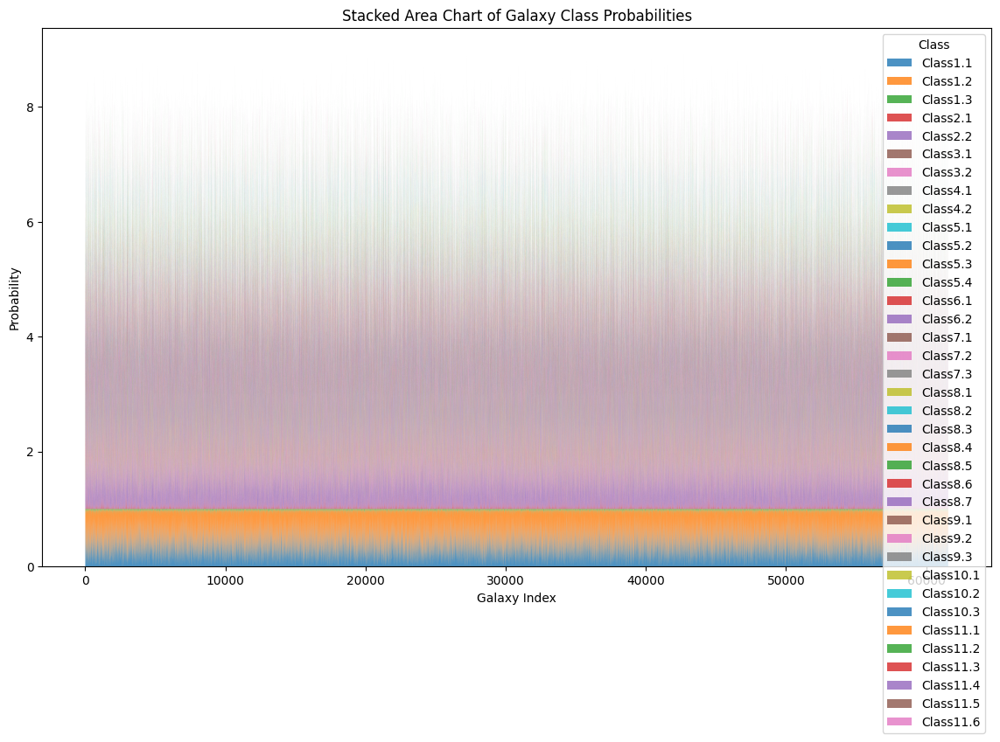

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

data = df.drop(columns=['GalaxyID'])

# Transpose the data for plotting with area plot
data = data.T

# Plotting
plt.figure(figsize=(14, 8))
plt.stackplot(range(1, len(data.columns) + 1), data, labels=data.index, alpha=0.8, cmap='viridis')

plt.title('Stacked Area Chart of Galaxy Class Probabilities')
plt.xlabel('Galaxy Index')
plt.ylabel('Probability')
plt.legend(title='Class', loc='upper right')
plt.show()




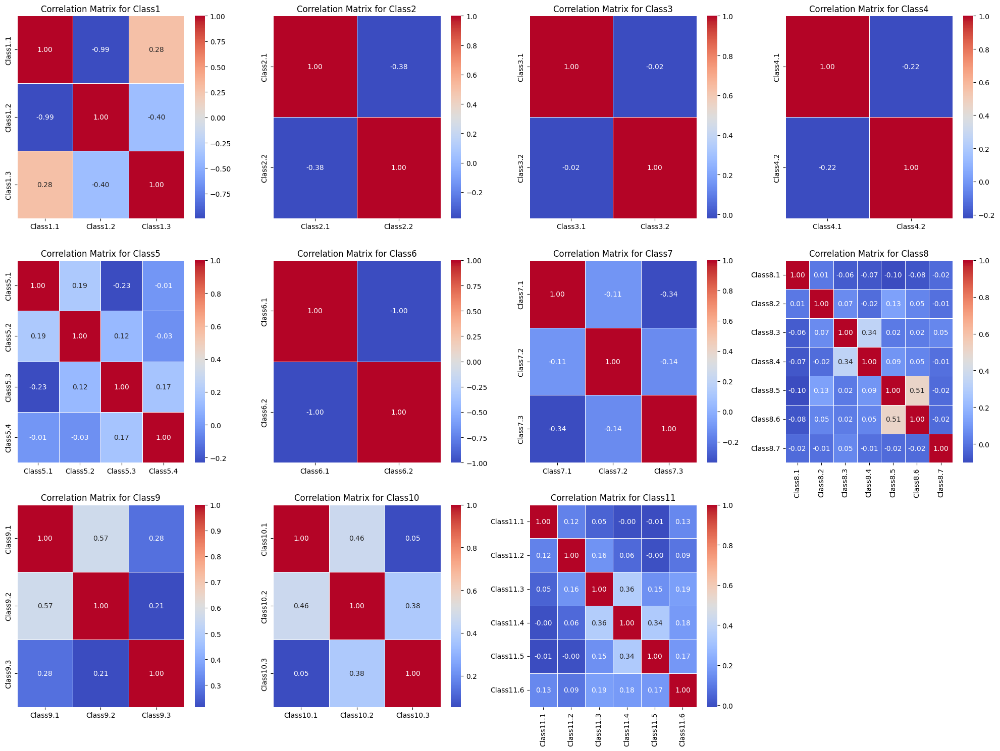

In [ ]:
# Correlation between different classes

column_groups = {
    'Class1': ['Class1.1', 'Class1.2', 'Class1.3'],
    'Class2': ['Class2.1', 'Class2.2'],
    'Class3': ['Class3.1', 'Class3.2'],
    'Class4': ['Class4.1', 'Class4.2'],
    'Class5': ['Class5.1', 'Class5.2', 'Class5.3', 'Class5.4'],
    'Class6': ['Class6.1', 'Class6.2'],
    'Class7': ['Class7.1', 'Class7.2', 'Class7.3'],
    'Class8': ['Class8.1', 'Class8.2', 'Class8.3', 'Class8.4', 'Class8.5', 'Class8.6', 'Class8.7'],
    'Class9': ['Class9.1', 'Class9.2', 'Class9.3'],
    'Class10': ['Class10.1', 'Class10.2', 'Class10.3'],
    'Class11': ['Class11.1', 'Class11.2', 'Class11.3', 'Class11.4', 'Class11.5', 'Class11.6']
}

# Determine the grid size
n_rows = 3
n_cols = 4

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))
axes = axes.flatten()

for i, (class_group, columns) in enumerate(column_groups.items()):
    correlation_matrix = df[columns].corr()

    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, ax=axes[i])
    axes[i].set_title(f'Correlation Matrix for {class_group}')

# Remove any empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()




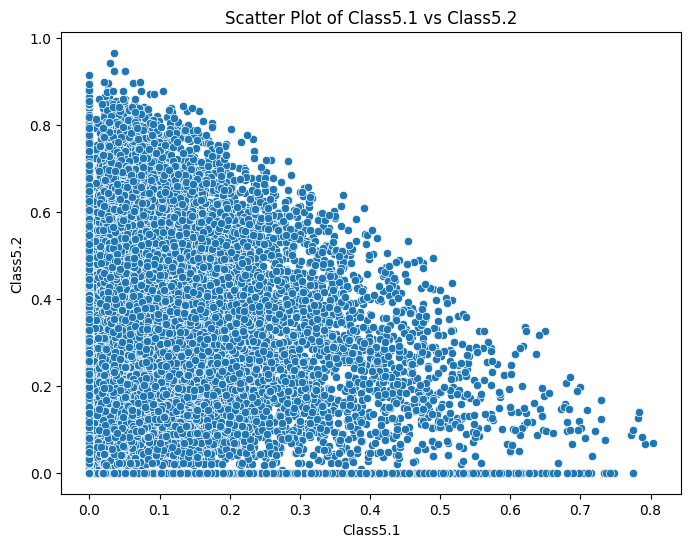

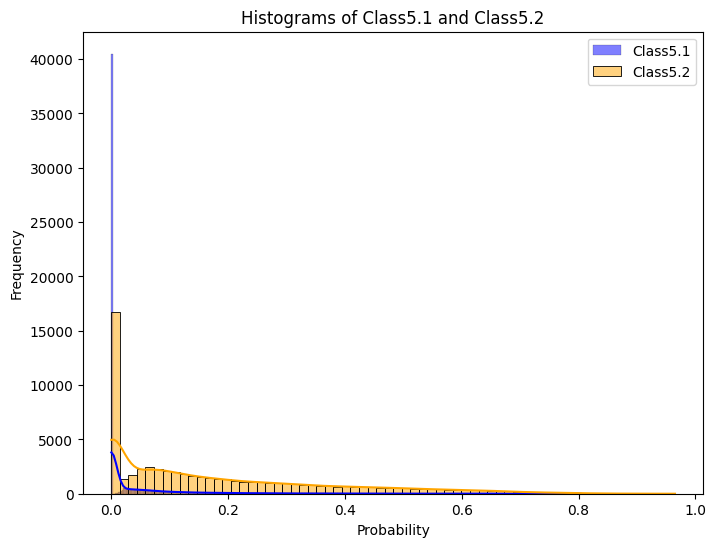

Descriptive Statistics for Class5.1 and Class5.2:
           Class5.1      Class5.2
count  61578.000000  61578.000000
mean       0.040842      0.180468
std        0.087419      0.192508
min        0.000000      0.000000
25%        0.000000      0.000000
50%        0.000000      0.116580
75%        0.044376      0.290133
max        0.803556      0.965112




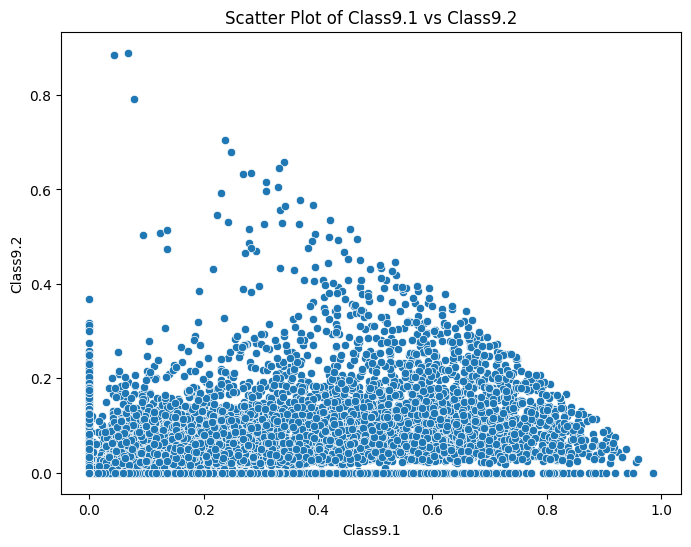

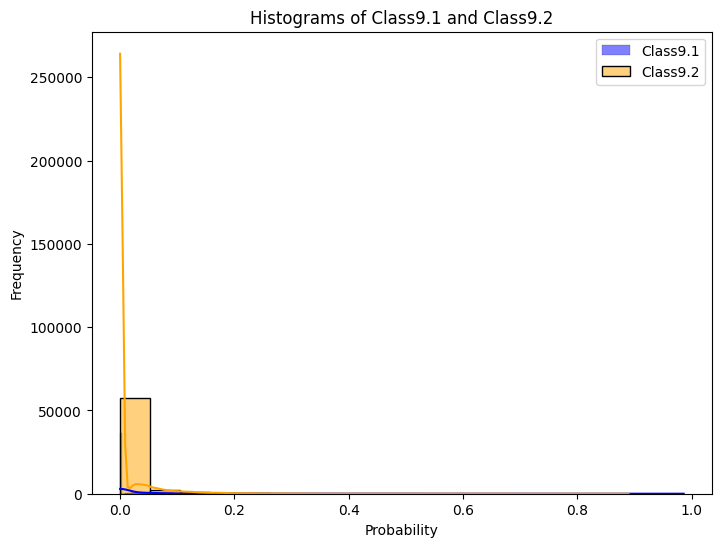

Descriptive Statistics for Class9.1 and Class9.2:
           Class9.1      Class9.2
count  61578.000000  61578.000000
mean       0.063014      0.010614
std        0.137545      0.038236
min        0.000000      0.000000
25%        0.000000      0.000000
50%        0.000000      0.000000
75%        0.056038      0.000000
max        0.985982      0.889493




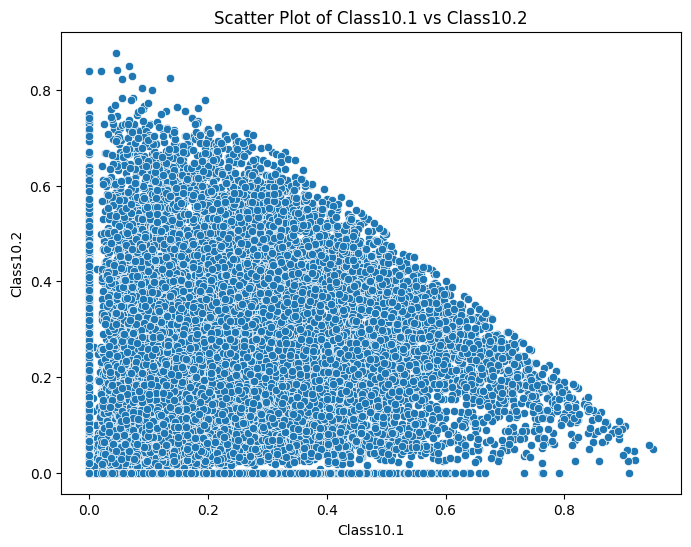

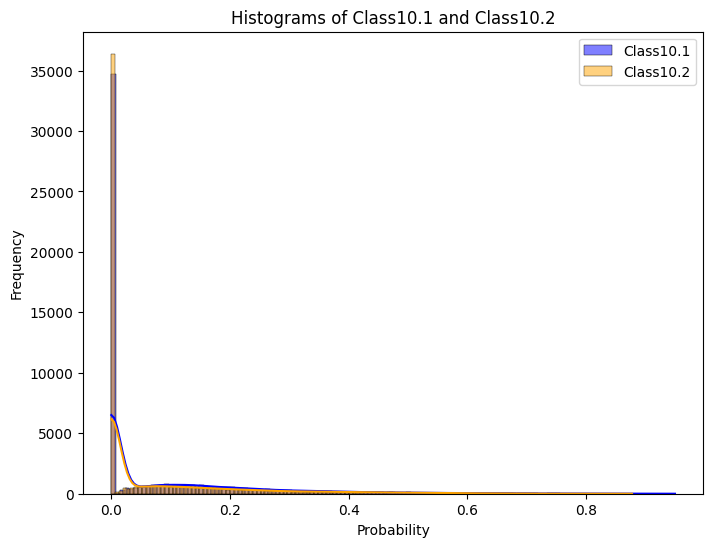

Descriptive Statistics for Class10.1 and Class10.2:
          Class10.1     Class10.2
count  61578.000000  61578.000000
mean       0.091801      0.083969
std        0.145125      0.139840
min        0.000000      0.000000
25%        0.000000      0.000000
50%        0.000000      0.000000
75%        0.147239      0.127381
max        0.949733      0.877393




In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define pairs of subclasses with moderate correlations
moderate_corr_pairs = [
    ('Class5.1', 'Class5.2'),
    ('Class9.1', 'Class9.2'),
    ('Class10.1', 'Class10.2')
]

# Plot scatter plots and histograms for these pairs
for (class1, class2) in moderate_corr_pairs:
    # Scatter plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=df[class1], y=df[class2])
    plt.title(f'Scatter Plot of {class1} vs {class2}')
    plt.xlabel(class1)
    plt.ylabel(class2)
    plt.show()

    # Histograms
    plt.figure(figsize=(8, 6))
    sns.histplot(df[class1], kde=True, label=class1, color='blue')
    sns.histplot(df[class2], kde=True, label=class2, color='orange')
    plt.title(f'Histograms of {class1} and {class2}')
    plt.xlabel('Probability')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

    # Descriptive statistics
    print(f'Descriptive Statistics for {class1} and {class2}:')
    print(df[[class1, class2]].describe())
    print('\n')


**Class 5 Interpretation:**

* Class 5 Question: "How prominent is the central bulge, compared with the rest of the galaxy?"
** Class5.1: "No bulge"
** Class5.2: "Just noticeable"
** Class5.3: "Obvious"
** Class5.4: "Dominant"

**Scatter Plot of Class5.1 vs. Class5.2:**

Negative Correlation: The scatter plot shows a clear negative correlation between Class5.1 and Class5.2. This makes sense because as the prominence of the central bulge increases (from Class5.1 to Class5.4), the likelihood of a galaxy being classified as having "No bulge" (Class5.1) decreases. Conversely, if a galaxy is classified as having "No bulge," it is unlikely to also be classified as having a "Just noticeable" bulge (Class5.2).

**Histograms of Class5.1 and Class5.2:**

Skewed Distribution: Both histograms are highly skewed to the right, indicating that many galaxies have low probabilities for both "No bulge" (Class5.1) and "Just noticeable" (Class5.2). This suggests that prominent central bulges are relatively rare in the dataset.

Comparison: The slightly broader spread for Class5.2 compared to Class5.1 indicates that while "No bulge" is a clear condition, "Just noticeable" bulges are slightly more common but still rare.

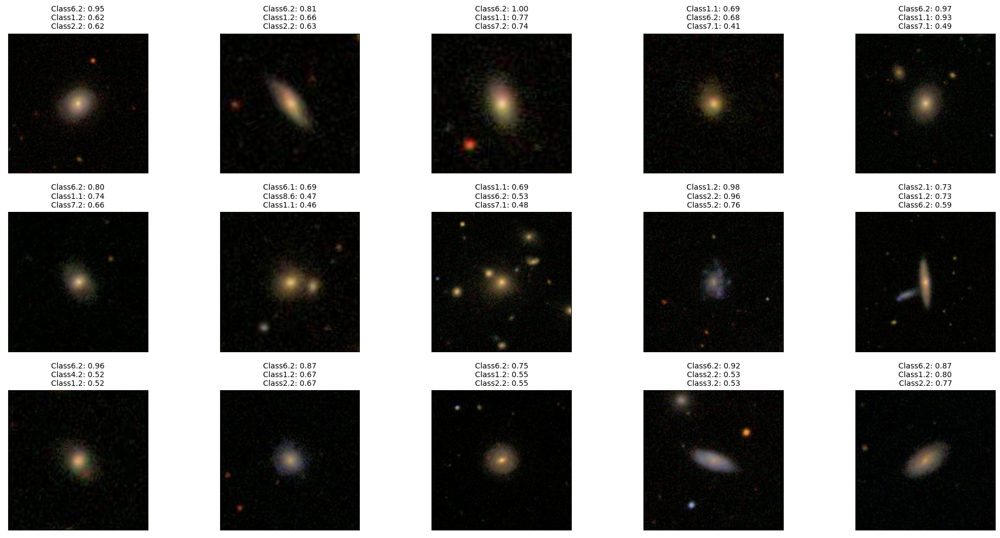

In [ ]:
#Print images from IMAGES_TRAINING_REV1 folder for each class distribution

import glob
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import matplotlib.pyplot as plt
import os
from PIL import Image

# Set the path to the folder containing the images
folder_path = '/content/mlpa-final-project/images_training_rev1'

image_extension = '.jpg'

# Create a figure with subplots in a 3x5 grid
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(20, 10))

# Flatten the axes array for easy iteration
axes = axes.ravel()

# Loop through the first 15 images in the dataframe
for idx, ax in enumerate(axes):
    if idx < len(df):
        # Get the GalaxyID, convert it to integer to remove any decimals, and then to string
        galaxy_id = int(df.iloc[idx]['GalaxyID'])
        image_path = os.path.join(folder_path, f'{galaxy_id}{image_extension}')

        # Open and display the image
        try:
            image = Image.open(image_path)
            ax.imshow(image)

            # Get the top 3 labels with the highest values (assumed to be probabilities)
            top_labels = df.iloc[idx, 1:].sort_values(ascending=False).head(3).index.tolist()
            top_probs = df.iloc[idx, 1:].sort_values(ascending=False).head(3).values

            # Set the title of the subplot with top 3 labels and their values
            title_text = '\n'.join([f'{label}: {prob:.2f}' for label, prob in zip(top_labels, top_probs)])
            ax.set_title(title_text, fontsize=10)

            # Hide axes ticks
            ax.set_xticks([])
            ax.set_yticks([])
        except FileNotFoundError:
            ax.set_title('File Not Found', fontsize=10)
            ax.axis('off')
    else:
        # Clear unused axes if there are fewer than 15 images
        ax.axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

## Create Dataset for Training, Validation, and Testing

In [ ]:
import tensorflow as tf
from sklearn.model_selection import train_test_split

ORIG_SHAPE = (424, 424)
CROP_SIZE = (224, 224)
IMG_SHAPE = (224, 224)

def create_datasets(df, batch_size=32, shuffle=True, augment=True, train_size=0.7, val_size=0.2, test_size=0.1):
    assert abs(train_size + val_size + test_size - 1) < 1e-6, "Sum of train, val, and test sizes must be very close to 1"

    # Set the values of x1 and y1 for cropping
    x1 = (ORIG_SHAPE[0] - CROP_SIZE[0]) // 2
    y1 = (ORIG_SHAPE[1] - CROP_SIZE[1]) // 2

    # Function to load and preprocess images
    def load_and_preprocess_images(path, x1, y1):
        image = tf.io.read_file(path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.crop_to_bounding_box(image, x1, y1, CROP_SIZE[0], CROP_SIZE[1])
        image = tf.image.convert_image_dtype(image, tf.float32)  # Normalize images
        return image

    # Function to prepare the dataset
    def prepare_dataset(paths, labels, augment, shuffle):
        path_ds = tf.data.Dataset.from_tensor_slices(paths)
        label_ds = tf.data.Dataset.from_tensor_slices(labels.astype('float32'))
        image_ds = path_ds.map(lambda x: load_and_preprocess_images(x, x1, y1), num_parallel_calls=tf.data.experimental.AUTOTUNE)

        if augment:
            image_ds = image_ds.map(lambda img: apply_augmentation(img), num_parallel_calls=tf.data.experimental.AUTOTUNE)

        full_ds = tf.data.Dataset.zip((image_ds, label_ds))

        if shuffle:
            full_ds = full_ds.shuffle(buffer_size=1000)

        return full_ds.batch(batch_size).prefetch(tf.data.experimental.AUTOTUNE)

    # Data augmentation function
    def apply_augmentation(image):
      image = tf.image.random_flip_left_right(image)
      image = tf.image.random_flip_up_down(image)
      image = tf.image.random_brightness(image, max_delta=0.2)
      image = tf.image.random_contrast(image, lower=0.5, upper=1.5)
      image = tf.image.random_saturation(image, lower=0.5, upper=1.5)
      image = tf.image.random_hue(image, max_delta=0.2)
      image = tf.image.rot90(image, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))
      return image

    # Splitting the dataset
    train_df, test_df = train_test_split(df, test_size=test_size, random_state=42)
    val_size_adjusted = val_size / (1 - test_size)  # Adjust validation size based on the remaining dataset
    train_df, val_df = train_test_split(train_df, test_size=val_size_adjusted, random_state=42)

    # Extract paths and labels
    train_paths = train_df['GalaxyID'].apply(lambda x: f'/content/mlpa-final-project/images_training_rev1/{x}.jpg').tolist()
    val_paths = val_df['GalaxyID'].apply(lambda x: f'/content/mlpa-final-project/images_training_rev1/{x}.jpg').tolist()
    test_paths = test_df['GalaxyID'].apply(lambda x: f'/content/mlpa-final-project/images_training_rev1/{x}.jpg').tolist()

    train_labels = train_df.iloc[:, 1:].values
    val_labels = val_df.iloc[:, 1:].values
    test_labels = test_df.iloc[:, 1:].values

    # Create datasets
    train_ds = prepare_dataset(train_paths, train_labels, augment, shuffle)
    val_ds = prepare_dataset(val_paths, val_labels, False, False)  # No augmentation or shuffling for validation
    test_ds = prepare_dataset(test_paths, test_labels, False, False)  # No augmentation or shuffling for testing

    return train_ds, val_ds, test_ds


In [ ]:
from sklearn.model_selection import train_test_split
import pandas as pd


# # Split into training and validation
# df_train, df_val = train_test_split(df, test_size=0.2)

# # Create training and validation datasets
# train_ds = create_dataset_training_val(df_train, batch_size=32, shuffle=True, repeat=True, augment=True)
# # Validation dataset - usually no need to shuffle
# val_ds = create_dataset_training_val(df_val, batch_size=32, shuffle=False, repeat=False)

train_ds, val_ds, test_ds = create_datasets(df)

### Step 3: Print the Shapes of All Datasets
print('Training dataset shape:', train_ds)
print('Validation dataset shape:', val_ds)
print('Test dataset shape:', test_ds)


Training dataset shape: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 37), dtype=tf.float32, name=None))>
Validation dataset shape: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 37), dtype=tf.float32, name=None))>
Test dataset shape: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 37), dtype=tf.float32, name=None))>


In [ ]:
df.head()

,GalaxyID,Class1.1,Class1.2,Class1.3,Class2.1,Class2.2,Class3.1,Class3.2,Class4.1,Class4.2,...,Class9.3,Class10.1,Class10.2,Class10.3,Class11.1,Class11.2,Class11.3,Class11.4,Class11.5,Class11.6
0,100008,0.383147,0.616853,0.000000,0.000000,0.616853,0.038452,0.578401,0.418398,0.198455,...,0.000000,0.279952,0.138445,0.000000,0.000000,0.092886,0.0,0.0,0.0,0.325512
1,100023,0.327001,0.663777,0.009222,0.031178,0.632599,0.467370,0.165229,0.591328,0.041271,...,0.018764,0.000000,0.131378,0.459950,0.000000,0.591328,0.0,0.0,0.0,0.000000
2,100053,0.765717,0.177352,0.056931,0.000000,0.177352,0.000000,0.177352,0.000000,0.177352,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
3,100078,0.693377,0.238564,0.068059,0.000000,0.238564,0.109493,0.129071,0.189098,0.049466,...,0.000000,0.094549,0.000000,0.094549,0.189098,0.000000,0.0,0.0,0.0,0.000000
4,100090,0.933839,0.000000,0.066161,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000


## Deep Learning CNN Model
This architecture is based ResNet34 with 2D CNNs and 1D CNNs.
The architecture outlined here is a deep convolutional neural network designed to handle image data efficiently. This model features a series of convolutional layers, batch normalization, ReLU activation functions, pooling layers, and dropout layers, culminating in a global average pooling followed by a dense output layer.

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, ReLU, Add, GlobalAveragePooling2D, Dense, MaxPooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K

@tf.function
def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true)))

def conv_block(input_tensor, kernel_size, filters, strides=(2, 2)):
    """A simple block for ResNet with a convolutional shortcut."""
    filter1, filter2 = filters

    # Main path
    x = Conv2D(filter1, (3, 3), strides=strides, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Conv2D(filter2, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Shortcut path
    shortcut = Conv2D(filter2, (1, 1), strides=strides, padding='same')(input_tensor)
    shortcut = BatchNormalization()(shortcut)

    # Add shortcut to the main path, and pass it through a RELU activation
    x = Add()([x, shortcut])
    x = ReLU()(x)
    return x

def ResNet34_grayscale(input_shape, classes):
    img_input = Input(shape=input_shape)
    x = Conv2D(64, (7, 7), strides=(2, 2), padding='same', name='conv1')(img_input)
    x = BatchNormalization(name='bn_conv1')(x)
    x = ReLU()(x)
    x = MaxPooling2D((3, 3), strides=(2, 2))(x)

    # Simplified residual blocks structure
    x = conv_block(x, kernel_size=(3, 3), filters=[64, 64], strides=(1, 1))
    x = Dropout(0.5)(x)  # Add dropout after first block
    x = conv_block(x, kernel_size=(3, 3), filters=[128, 128])
    x = Dropout(0.5)(x)  # Add dropout after second block
    x = conv_block(x, kernel_size=(3, 3), filters=[256, 256])
    x = Dropout(0.5)(x)  # Add dropout after third block
    x = conv_block(x, kernel_size=(3, 3), filters=[512, 512])
    x = Dropout(0.5)(x)  # Add dropout after fourth block

    x = GlobalAveragePooling2D()(x)
    x = Dense(classes, activation='sigmoid')(x)
    model = Model(inputs=img_input, outputs=x, name='resnet34')
    return model

# Setting up MirroredStrategy
strategy = tf.distribute.MirroredStrategy()
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

with strategy.scope():
    model = ResNet34_grayscale(input_shape=(224, 224, 3), classes=37)
    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy',root_mean_squared_error])

# Display model architecture
model.summary()



Number of devices: 1


Model: "resnet34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1 (Conv2D)            │ (None, 112, 112, 64)   │          9,472 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_conv1                  │ (None, 112, 112, 64)   │            256 │ conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 112, 112, 64)   │              0 │ bn_conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 55, 55, 64)     │              0 │ re_lu[0][0]            │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 55, 55, 64)     │         36,928 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 55, 55, 64)     │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 55, 55, 64)     │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 55, 55, 64)     │         36,928 │ re_lu_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 55, 55, 64)     │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 55, 55, 64)     │          4,160 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 55, 55, 64)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 55, 55, 64)     │            256 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 55, 55, 64)     │              0 │ re_lu_2[0][0],         │
│                           │                        │                │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 55, 55, 64)     │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 55, 55, 64)     │              0 │ re_lu_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)    

 Total params: 4,937,829 (18.84 MB)

 Trainable params: 4,931,941 (18.81 MB)

 Non-trainable params: 5,888 (23.00 KB)

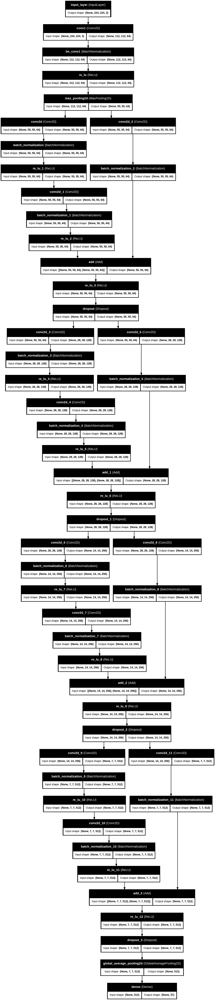

In [ ]:
from keras.utils import plot_model

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
!pip install manim


##Visualization

In [ ]:
print(model.layers)

[<InputLayer name=input_layer, built=True>, <Conv2D name=conv1, built=True>, <BatchNormalization name=bn_conv1, built=True>, <ReLU name=re_lu, built=True>, <MaxPooling2D name=max_pooling2d, built=True>, <Conv2D name=conv2d, built=True>, <BatchNormalization name=batch_normalization, built=True>, <ReLU name=re_lu_1, built=True>, <Conv2D name=conv2d_1, built=True>, <BatchNormalization name=batch_normalization_1, built=True>, <Conv2D name=conv2d_2, built=True>, <ReLU name=re_lu_2, built=True>, <BatchNormalization name=batch_normalization_2, built=True>, <Add name=add, built=True>, <ReLU name=re_lu_3, built=True>, <Dropout name=dropout, built=True>, <Conv2D name=conv2d_3, built=True>, <BatchNormalization name=batch_normalization_3, built=True>, <ReLU name=re_lu_4, built=True>, <Conv2D name=conv2d_4, built=True>, <BatchNormalization name=batch_normalization_4, built=True>, <Conv2D name=conv2d_5, built=True>, <ReLU name=re_lu_5, built=True>, <BatchNormalization name=batch_normalization_5, bui

In [ ]:
# import numpy as np
# import cv2
# from manim import *
# from tensorflow.keras.models import Model
# from io import StringIO
# from contextlib import redirect_stdout

# image_path = '/content/mlpa-final-project/images_training_rev1/100143.jpg'


# class NeuralNetwork(Scene):
#     def __init__(self, model_summary, **kwargs):
#         super().__init__(**kwargs)
#         self.model_summary = model_summary

#     def construct(self):
#         self.camera.background_color = WHITE

#         # Initialize position
#         prev_layer = None
#         layer_distance = 1.5
#         layer_objects = []

#         for line in self.model_summary.split('\n'):
#             if '│' in line:
#                 layer_info = line.split('│')
#                 layer_name = layer_info[1].strip()
#                 output_shape = layer_info[2].strip()

#                 shape, color = self.get_layer_viz(layer_name)

#                 layer_viz = shape.set_color(color).set_fill(color, opacity=0.3).scale(0.5)
#                 layer_text = Text(layer_name, color=BLACK).scale(0.3)
#                 output_shape_text = Text(output_shape, color=BLACK).scale(0.3)

#                 if prev_layer is None:
#                     layer_viz.move_to(ORIGIN)
#                 else:
#                     layer_viz.next_to(prev_layer, RIGHT, buff=layer_distance)

#                 layer_text.next_to(layer_viz, UP)
#                 output_shape_text.next_to(layer_viz, DOWN)
#                 layer_objects.append((layer_viz, layer_text, output_shape_text))

#                 self.play(FadeIn(layer_viz), FadeIn(layer_text), FadeIn(output_shape_text))

#                 if prev_layer is not None:
#                     self.play(Create(Line(prev_layer.get_right(), layer_viz.get_left())))

#                 prev_layer = layer_viz

#         # Animate the flow of information through the network
#         for i in range(len(layer_objects) - 1):
#             current_layer, current_text, current_output_shape = layer_objects[i]
#             next_layer, next_text, next_output_shape = layer_objects[i + 1]

#             arrow = Arrow(current_layer.get_right(), next_layer.get_left())
#             self.play(Create(arrow))
#             self.wait(0.5)
#             self.play(FadeOut(arrow))

#         self.wait(2)

#     def get_layer_viz(self, layer_name):
#         shape_map = {
#             'InputLayer': Rectangle(),
#             'Conv2D': Rectangle(),
#             'BatchNormalization': Rectangle(),
#             'ReLU': Rectangle(),
#             'MaxPooling2D': Rectangle(),
#             'Dropout': Rectangle(),
#             'GlobalAveragePooling2D': Rectangle(),
#             'Dense': Circle(),
#             'Add': Rectangle()
#         }

#         color_map = {
#             'InputLayer': WHITE,
#             'Conv2D': BLUE,
#             'BatchNormalization': YELLOW,
#             'ReLU': ORANGE,
#             'MaxPooling2D': RED,
#             'Dropout': PURPLE,
#             'GlobalAveragePooling2D': PINK,
#             'Dense': GREEN,
#             'Add': BLUE_E
#         }

#         layer_type = layer_name.split(' ')[0]
#         return shape_map.get(layer_type, Rectangle()), color_map.get(layer_type, WHITE)


# if __name__ == "__main__":
#   # Redirect the model summary output to a string buffer
#   string_buffer = StringIO()
#   with redirect_stdout(string_buffer):
#       model.summary()
#   # Get the model summary as a string
#   model_summary = string_buffer.getvalue()

#   # Get the model summary as a string
#   model_summary = string_buffer.getvalue()
#   scene = NeuralNetwork(model_summary)
#   scene.render(preview=True)

Model: "resnet34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1 (Conv2D)            │ (None, 112, 112, 64)   │          9,472 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_conv1                  │ (None, 112, 112, 64)   │            256 │ conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 112, 112, 64)   │              0 │ bn_conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 55, 55, 64)     │              0 │ re_lu[0][0]            │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 55, 55, 64)     │         36,928 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 55, 55, 64)     │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 55, 55, 64)     │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 55, 55, 64)     │         36,928 │ re_lu_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 55, 55, 64)     │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 55, 55, 64)     │          4,160 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 55, 55, 64)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 55, 55, 64)     │            256 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 55, 55, 64)     │              0 │ re_lu_2[0][0],         │
│                           │                        │                │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 55, 55, 64)     │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 55, 55, 64)     │              0 │ re_lu_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)    

 Total params: 4,937,829 (18.84 MB)

 Trainable params: 4,931,941 (18.81 MB)

 Non-trainable params: 5,888 (23.00 KB)

[05/16/24 19:52:54] INFO     Animation 0 : Using cached data (hash :                           ]8;id=881078;file:///usr/local/lib/python3.10/dist-packages/manim/renderer/cairo_renderer.py\cairo_renderer.py]8;;\:]8;id=251875;file:///usr/local/lib/python3.10/dist-packages/manim/renderer/cairo_renderer.py#88\88]8;;\
                             2621265332_66111383_631829896)                                                        

INFO:manim:Animation 0 : Using cached data (hash : 2621265332_66111383_631829896)


                    INFO     Combining to Movie file.                                      ]8;id=544949;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=914570;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#617\617]8;;\

INFO:manim:Combining to Movie file.


                    INFO                                                                   ]8;id=32952;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=687471;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#737\737]8;;\
                             File ready at                                                                         
                             '/content/media/videos/1080p60/NeuralNetwork.mp4'                                     
                                                                                                                   

INFO:manim:
File ready at '/content/media/videos/1080p60/NeuralNetwork.mp4'



                    INFO     Rendered NeuralNetwork                                                    ]8;id=404943;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene.py\scene.py]8;;\:]8;id=815806;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene.py#247\247]8;;\
                             Played 1 animations                                                                   

INFO:manim:Rendered NeuralNetwork
Played 1 animations


                    INFO     Previewed File at: '/content/media/videos/1080p60/NeuralNetwork.mp4'   ]8;id=535210;file:///usr/local/lib/python3.10/dist-packages/manim/utils/file_ops.py\file_ops.py]8;;\:]8;id=139761;file:///usr/local/lib/python3.10/dist-packages/manim/utils/file_ops.py#231\231]8;;\

INFO:manim:Previewed File at: '/content/media/videos/1080p60/NeuralNetwork.mp4'


## Train the model and evaluate

In [ ]:
# Train the model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input, Conv2D, MaxPooling2D, Activation, Flatten, BatchNormalization, GlobalMaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tqdm.keras import TqdmCallback

# Repeat the train dataset indefinitely
train_ds_repeat = train_ds.repeat()

# Repeat the validation dataset indefinitely
val_ds_repeat = val_ds.repeat()

epochs = 70
#steps_per_epoch = len(df_train) // 32
steps_per_epoch = 1450
validation_steps = 250

callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1),
    TqdmCallback(verbose=1),
    ModelCheckpoint('/content/mlpa-final-project/models/model_version6.keras',
              monitor='val_loss', save_best_only=True)
]

with strategy.scope():
  history = model.fit(train_ds_repeat, steps_per_epoch=steps_per_epoch, epochs=epochs,
                      validation_data=val_ds_repeat, validation_steps=validation_steps, verbose=1, callbacks=callbacks)
# Save the model
model.save('/content/mlpa-final-project/models/galaxy_classification_model_Version5.keras')

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/70
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 83s 57ms/step - accuracy: 0.7777 - loss: 0.2369 - root_mean_squared_error: 0.0928 - val_accuracy: 0.7807 - val_loss: 0.2374 - val_root_mean_squared_error: 0.0908 - learning_rate: 1.0000e-04
Epoch 2/70
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 83s 57ms/step - accuracy: 0.7802 - loss: 0.2364 - root_mean_squared_error: 0.0924 - val_accuracy: 0.7856 - val_loss: 0.2338 - val_root_mean_squared_error: 0.0888 - learning_rate: 1.0000e-04
Epoch 3/70
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 82s 56ms/step - accuracy: 0.7829 - loss: 0.2366 - root_mean_squared_error: 0.0923 - val_accuracy: 0.7885 - val_loss: 0.2347 - val_root_mean_squared_error: 0.0895 - learning_rate: 1.0000e-04
Epoch 4/70
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 82s 56ms/step - accuracy: 0.7845 - loss: 0.2367 - root_mean_squared_error: 0.0925 - val_accuracy: 0.7916 - val_loss: 0.2363 - val_root_mean_squared_error: 0.0895 - learning_rate: 1.0000e-04
Epoch 5/70
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 82s 56ms/step - accuracy: 0.78

In [ ]:
# Define the custom function
@tf.function
def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# Testing

In [ ]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
from skimage.transform import resize
from tensorflow.keras.models import load_model
import tensorflow as tf
%matplotlib inline

# Assuming you have defined your functions and variables like IMG_SHAPE, ORIG_SHAPE, CROP_SIZE, etc.

batch_size = 1
ORIG_SHAPE = (424,424)
CROP_SIZE = (224,224)
IMG_SHAPE = (224,224)

model_path = '/content/mlpa-final-project/models/galaxy_classification_model_Version5.keras'

# Load the model
loaded_model = tf.keras.models.load_model(model_path, custom_objects={'root_mean_squared_error': root_mean_squared_error}, compile=False)

loaded_model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy',root_mean_squared_error])


# Evaluate the model on the test dataset
result = loaded_model.evaluate(test_ds)

# The result includes loss and other metrics that were used when compiling the model, such as accuracy
print("Test Loss:", result[0])
print("Test Accuracy:", result[1])
print("Test RMSE:", result[2])  # RMSE is the third metric

193/193 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.7841 - loss: 0.2368 - root_mean_squared_error: 0.0902
Test Loss: 0.23669090867042542
Test Accuracy: 0.7832088470458984
Test RMSE: 0.09053200483322144


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf

# Assuming model is already loaded and test_ds is properly batched
# First, let's extract labels and IDs, if they are available directly

# Let's prepare an empty list to collect labels
all_labels = []

# Since test_ds is batched, we iterate through it
for images, labels in test_ds:
    all_labels.extend(labels.numpy())

# Convert the list of labels to a NumPy array
all_labels = np.array(all_labels)

In [ ]:
# Define the column names based on the classes you provided
column_names = [
    'Class1.1', 'Class1.2', 'Class1.3', 'Class2.1', 'Class2.2',
    'Class3.1', 'Class3.2', 'Class4.1', 'Class4.2', 'Class5.1', 'Class5.2',
    'Class5.3', 'Class5.4', 'Class6.1', 'Class6.2', 'Class7.1', 'Class7.2',
    'Class7.3', 'Class8.1', 'Class8.2', 'Class8.3', 'Class8.4', 'Class8.5',
    'Class8.6', 'Class8.7', 'Class9.1', 'Class9.2', 'Class9.3', 'Class10.1',
    'Class10.2', 'Class10.3', 'Class11.1', 'Class11.2', 'Class11.3',
    'Class11.4', 'Class11.5', 'Class11.6'
]

# Create the DataFrame
test_df = pd.DataFrame(all_labels, columns=column_names)


In [ ]:
# Assuming 'model' is your trained TensorFlow model
predictions = loaded_model.predict(test_ds)

# Add predictions to the DataFrame or create a new DataFrame for them
prediction_df = pd.DataFrame(predictions, columns=column_names)


193/193 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step


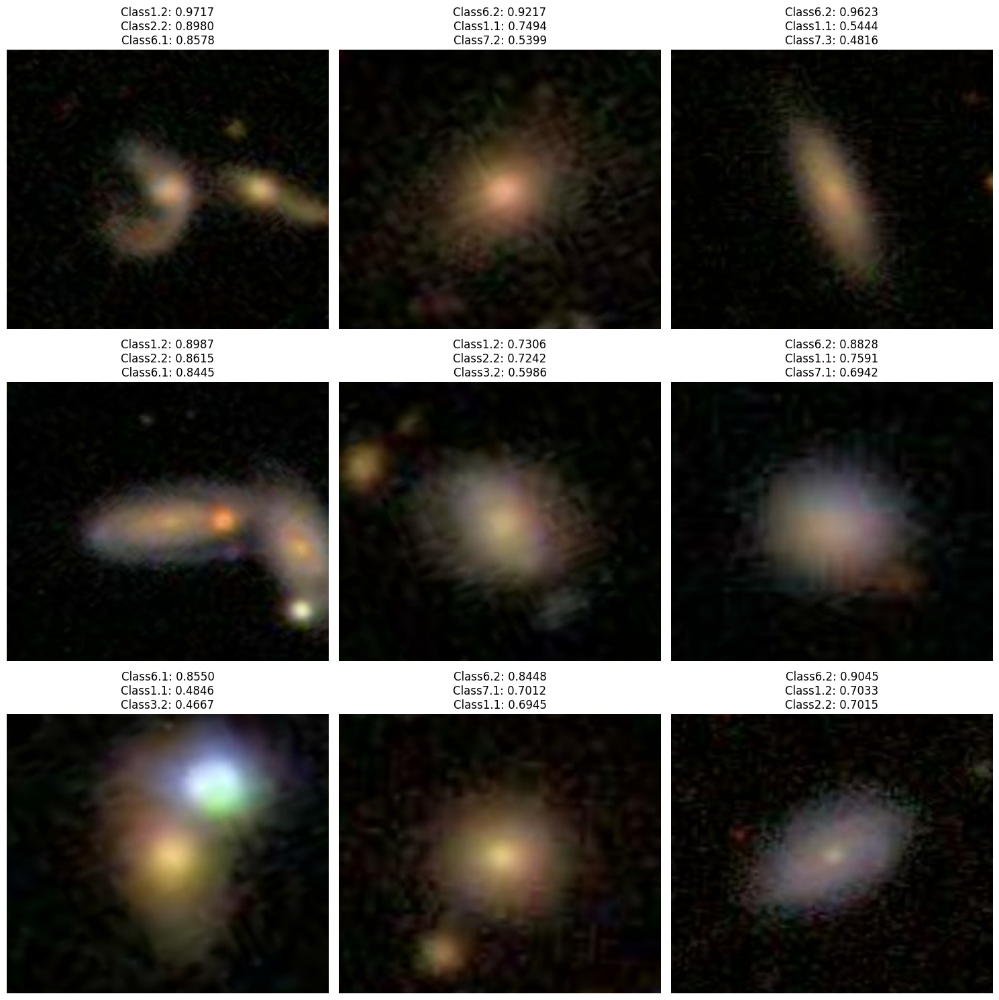

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define how many samples you want to display
num_samples = 9
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))  # 3x3 grid, adjust size as needed

# We need to make sure to take a batch or batches that include at least num_samples images
images, labels = next(iter(test_ds.unbatch().batch(num_samples)))

# Get predictions for these images, assuming predictions are in the same order as test_ds
batch_predictions = prediction_df.head(num_samples).values

# Plot each image and its predicted classes
for i, (image, prediction) in enumerate(zip(images.numpy(), batch_predictions)):
    ax = axs[i // 3, i % 3]  # Calculate subplot index
    ax.imshow(image, aspect='auto')  # Plot the image
    ax.axis('off')  # Turn off axis

    # Get top 3 predicted classes and their probabilities
    top_indices = np.argsort(prediction)[-3:][::-1]  # Indices of top 3 predictions
    top_classes = prediction_df.columns[top_indices]  # Get class names using indices
    top_probs = prediction[top_indices]  # Get top probabilities

    # Create text annotation with class names and probabilities
    text = '\n'.join([f'{cls}: {prob:.4f}' for cls, prob in zip(top_classes, top_probs)])
    ax.set_title(text, fontsize=12)  # Set the title of the subplot to the prediction text

plt.tight_layout()
plt.show()


In [ ]:
column_names = [
    'Class1.1', 'Class1.2', 'Class1.3', 'Class2.1', 'Class2.2',
    'Class3.1', 'Class3.2', 'Class4.1', 'Class4.2', 'Class5.1', 'Class5.2',
    'Class5.3', 'Class5.4', 'Class6.1', 'Class6.2', 'Class7.1', 'Class7.2',
    'Class7.3', 'Class8.1', 'Class8.2', 'Class8.3', 'Class8.4', 'Class8.5',
    'Class8.6', 'Class8.7', 'Class9.1', 'Class9.2', 'Class9.3', 'Class10.1',
    'Class10.2', 'Class10.3', 'Class11.1', 'Class11.2', 'Class11.3',
    'Class11.4', 'Class11.5', 'Class11.6'
]

# Create a dictionary mapping index to class label
class_labels = {i: name for i, name in enumerate(column_names)}


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model

def display_images_with_predictions(test_dir, model_path, model, num_images=10):
    """
    Loads images, preprocesses them, makes predictions using a trained model,
    and displays the images with predictions.

    Parameters:
    - test_dir: Directory containing the test images.
    - model_path: Path to the trained model.
    - num_images: Number of images to process and display.
    """

    # Load the model
    if model is None:
      model = load_model(model_path, compile=False)

    # Get a list of image filenames from the directory
    filenames = os.listdir(test_dir)
    selected_filenames = filenames[:num_images]  # Select the first 'num_images' images

    # Function to preprocess images
    def preprocess_image(image_path):
        original_img = load_img(image_path)  # Load original image for display
        img = load_img(image_path, target_size=(224, 224))  # Resize for model input
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Model expects batches of images
        img_array /= 255.0  # Normalize pixel values if the model expects [0, 1]
        return img_array, original_img

    # Load and preprocess images, keeping originals for display
    preprocessed_images = []
    original_images = []
    for fname in selected_filenames:
        processed_img, original_img = preprocess_image(os.path.join(test_dir, fname))
        preprocessed_images.append(processed_img)
        original_images.append(original_img)
    preprocessed_images = np.vstack(preprocessed_images)  # Stack for model prediction

    # Make predictions
    predictions = model.predict(preprocessed_images)

    # Display the original images and predictions
    fig, axs = plt.subplots(nrows=2, ncols=(num_images // 2), figsize=(15, 6))
    for i, (original_img, prediction) in enumerate(zip(original_images, predictions)):
        ax = axs[i // (num_images // 2), i % (num_images // 2)]
        ax.imshow(original_img)  # Display original image
        ax.axis('off')

        # Get indices of the top 3 probabilities
        top_indices = np.argsort(-prediction)[:3]
        top_classes = [column_names[i] for i in top_indices]
        top_probs = prediction[top_indices]

        # Create a title string with the top 3 predictions
        title_text = '\n'.join([f'{cls}: {prob:.4f}' for cls, prob in zip(top_classes, top_probs)])
        ax.set_title(title_text, fontsize=10)

    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 785ms/step


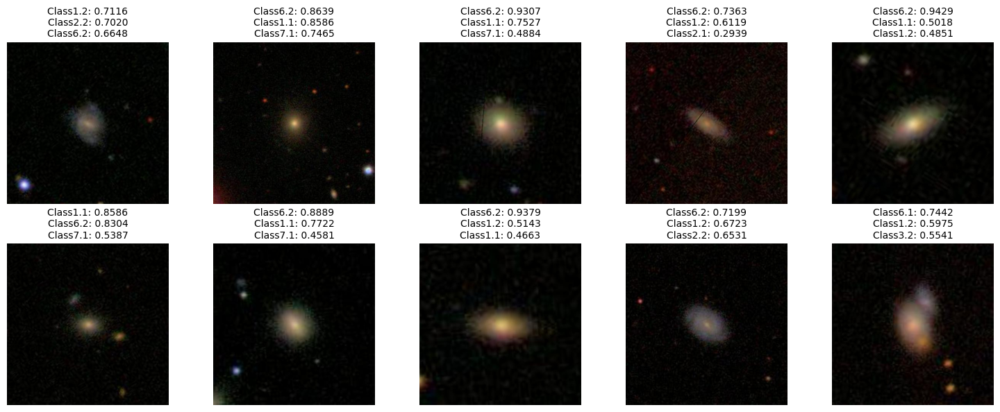

In [ ]:
test_directory = '/content/mlpa-final-project/images_test_rev1/'
model_path = '/content/mlpa-final-project/models/galaxy_classification_model_Version5.keras'
display_images_with_predictions(test_directory, model_path, model=None, num_images=10)

## Model improvement by balancing class imbalance

## Try 1 - Balanced class weights

In [ ]:
model = load_model(model_path, compile=False)

In [ ]:
import numpy as np
import tensorflow as tf

# Initialize a variable to hold the class counts
class_counts = None

# Iterate over the dataset
for images, labels in train_ds:
    # Sum up the one-hot encoded labels
    if class_counts is None:
        class_counts = np.sum(labels, axis=0)
    else:
        class_counts += np.sum(labels, axis=0)

# Print the class distribution
for i, count in enumerate(class_counts):
    print(f"Class {i}: {count}")


Class 0: 18677.89453125
Class 1: 23333.916015625
Class 2: 1092.180419921875
Class 3: 4583.6982421875
Class 4: 18750.208984375
Class 5: 4417.94140625
Class 6: 14332.2822265625
Class 7: 9276.4072265625
Class 8: 9473.810546875
Class 9: 1752.1676025390625
Class 10: 7760.57958984375
Class 11: 7661.31103515625
Class 12: 1576.15625
Class 13: 9993.388671875
Class 14: 33110.62109375
Class 15: 7288.00341796875
Class 16: 9026.724609375
Class 17: 2363.17041015625
Class 18: 1496.7877197265625
Class 19: 580.9432373046875
Class 20: 1404.9324951171875
Class 21: 1723.565673828125
Class 22: 2798.361083984375
Class 23: 1819.09326171875
Class 24: 169.7032012939453
Class 25: 2720.534423828125
Class 26: 459.1926574707031
Class 27: 1403.9718017578125
Class 28: 3957.71044921875
Class 29: 3613.710205078125
Class 30: 1704.982421875
Class 31: 669.7728881835938
Class 32: 4058.11083984375
Class 33: 753.0344848632812
Class 34: 331.86517333984375
Class 35: 300.85980224609375
Class 36: 3162.752197265625


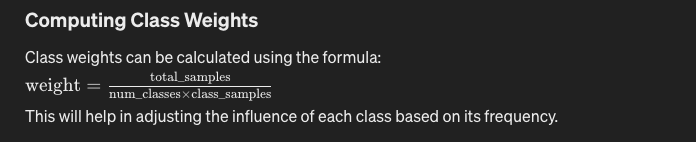

In [ ]:
import tensorflow as tf

# Class counts from the data
class_counts = np.array([
    18677.89, 23333.92, 1092.18, 4583.70, 18750.21,
    4417.94, 14332.28, 9276.41, 9473.81, 1752.17,
    7760.58, 7661.31, 1576.16, 9993.39, 33110.62,
    7288.00, 9026.72, 2363.17, 1496.79, 580.94,
    1404.93, 1723.57, 2798.36, 1819.09, 169.70,
    2720.53, 459.19, 1403.97, 3957.71, 3613.71,
    1704.98, 669.77, 4058.11, 753.03, 331.87,
    300.86, 3162.75
])

# Total samples
total_samples = np.sum(class_counts)

# Number of classes
num_classes = len(class_counts)

# Calculate class weights
class_weights = total_samples / (class_counts * num_classes)

# Convert class weights to a TensorFlow constant
class_weights_tf = tf.constant(class_weights, dtype=tf.float32)

# Printing the computed weights for verification
for i, weight in enumerate(class_weights):
    print(f"Class {i}: Weight = {weight:.4f}")


import tensorflow as tf

def weighted_binary_crossentropy(class_weights):
    def loss(y_true, y_pred):
        # Ensure y_true and y_pred are of float type for multiplication operations
        y_true = tf.cast(y_true, dtype=tf.float32)
        y_pred = tf.cast(y_pred, dtype=tf.float32)

        # Compute standard binary crossentropy
        bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)

        # Reshape and broadcast class weights tensor
        class_weights_tensor = tf.constant(class_weights, dtype=tf.float32)
        class_weights_tensor = tf.reshape(class_weights_tensor, (1, -1))  # Reshape for broadcasting

        # Tile the class weights tensor to match the shape of y_true
        class_weights_tensor = tf.tile(class_weights_tensor, [tf.shape(y_true)[0], 1])

        # Gather the class weights based on the true labels
        sample_weights = tf.gather(class_weights_tensor, tf.cast(tf.argmax(y_true, axis=-1), tf.int32), batch_dims=1)

        # Apply the sample weights to the binary crossentropy
        weighted_bce = sample_weights * bce

        # Reduce mean across all dimensions
        return tf.reduce_mean(weighted_bce)

    return loss

# Example weights, adjust as necessary based on actual class weights
class_weights_tf = class_weights

# Initialize your custom loss function with the class weights
custom_loss_fn = weighted_binary_crossentropy(class_weights_tf)




Class 0: Weight = 0.3149
Class 1: Weight = 0.2520
Class 2: Weight = 5.3847
Class 3: Weight = 1.2830
Class 4: Weight = 0.3137
Class 5: Weight = 1.3312
Class 6: Weight = 0.4103
Class 7: Weight = 0.6340
Class 8: Weight = 0.6208
Class 9: Weight = 3.3565
Class 10: Weight = 0.7578
Class 11: Weight = 0.7676
Class 12: Weight = 3.7313
Class 13: Weight = 0.5885
Class 14: Weight = 0.1776
Class 15: Weight = 0.8070
Class 16: Weight = 0.6515
Class 17: Weight = 2.4886
Class 18: Weight = 3.9291
Class 19: Weight = 10.1234
Class 20: Weight = 4.1860
Class 21: Weight = 3.4122
Class 22: Weight = 2.1016
Class 23: Weight = 3.2330
Class 24: Weight = 34.6558
Class 25: Weight = 2.1617
Class 26: Weight = 12.8075
Class 27: Weight = 4.1889
Class 28: Weight = 1.4860
Class 29: Weight = 1.6274
Class 30: Weight = 3.4494
Class 31: Weight = 8.7808
Class 32: Weight = 1.4492
Class 33: Weight = 7.8099
Class 34: Weight = 17.7211
Class 35: Weight = 19.5476
Class 36: Weight = 1.8595


In [ ]:
epochs_weighted = 10

with strategy.scope():
  model = load_model(model_path, compile=False)
  model.compile(optimizer='adam', loss=custom_loss_fn, metrics=['accuracy', root_mean_squared_error])
  history = model.fit(train_ds_repeat, steps_per_epoch=steps_per_epoch, epochs=epochs_weighted,
                      validation_data=val_ds_repeat, validation_steps=validation_steps, verbose=1, callbacks=callbacks)
# Save the model
model.save('/content/mlpa-final-project/models/galaxy_classification_model_Version6.keras')

Epoch 1/10
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 104s 55ms/step - accuracy: 0.7638 - loss: 0.0575 - root_mean_squared_error: 0.0958 - val_accuracy: 0.7738 - val_loss: 0.0578 - val_root_mean_squared_error: 0.0961 - learning_rate: 0.0010
Epoch 2/10
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 79s 54ms/step - accuracy: 0.7649 - loss: 0.0574 - root_mean_squared_error: 0.0961 - val_accuracy: 0.7649 - val_loss: 0.0575 - val_root_mean_squared_error: 0.1016 - learning_rate: 0.0010
Epoch 3/10
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 79s 54ms/step - accuracy: 0.7672 - loss: 0.0576 - root_mean_squared_error: 0.0966 - val_accuracy: 0.7670 - val_loss: 0.0571 - val_root_mean_squared_error: 0.0943 - learning_rate: 0.0010
Epoch 4/10
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 80s 55ms/step - accuracy: 0.7676 - loss: 0.0573 - root_mean_squared_error: 0.0965 - val_accuracy: 0.7644 - val_loss: 0.0571 - val_root_mean_squared_error: 0.0976 - learning_rate: 0.0010
Epoch 5/10
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 79s 54ms/step - accuracy: 0.7693 - loss: 0.05

In [ ]:
# Evaluate the model on the test dataset
result = model.evaluate(test_ds)

# The result includes loss and other metrics that were used when compiling the model, such as accuracy
print("Test Loss:", result[0])
print("Test Accuracy:", result[1])
print("Test RMSE:", result[2])  # RMSE is the third metric

193/193 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7656 - loss: 0.0582 - root_mean_squared_error: 0.0961
Test Loss: 0.05731186270713806
Test Accuracy: 0.7616109251976013
Test RMSE: 0.0969850942492485


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step


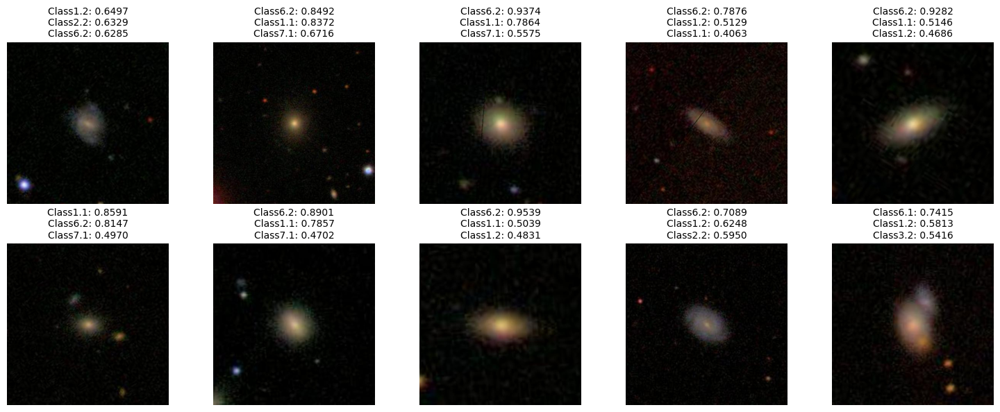

In [ ]:
test_directory = '/content/mlpa-final-project/images_test_rev1/'
model_path_6 = '/content/mlpa-final-project/models/galaxy_classification_model_Version6.keras'
display_images_with_predictions(test_directory, model_path_6, model = None, num_images=10)

## Try 2: Focal Loss: This is particularly useful for imbalance as it focuses training on hard-to-classify examples and down-weights the loss assigned to well-classified examples.

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input, Conv2D, MaxPooling2D, Activation, Flatten, BatchNormalization, GlobalMaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tqdm.keras import TqdmCallback
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K

strategy = tf.distribute.MirroredStrategy()

# Repeat the train dataset indefinitely
train_ds_repeat = train_ds.repeat()

# Repeat the validation dataset indefinitely
val_ds_repeat = val_ds.repeat()

steps_per_epoch = 1450
validation_steps = 250

callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1),
    TqdmCallback(verbose=1),
    ModelCheckpoint('/content/mlpa-final-project/models/model_version7.keras',
              monitor='val_loss', save_best_only=True)
]

def focal_loss(gamma=2., alpha=4.):
    gamma = float(gamma)
    alpha = float(alpha)
    def focal_loss_fixed(y_true, y_pred):
        """Focal loss for multi-class classification"""
        epsilon = tf.keras.backend.epsilon()
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        y_true = tf.cast(y_true, tf.float32)

        alpha_t = y_true * alpha + (tf.keras.backend.ones_like(y_true) - y_true) * (1 - alpha)
        p_t = y_true * y_pred + (tf.keras.backend.ones_like(y_true) - y_true) * (1 - y_pred)
        fl = - alpha_t * tf.keras.backend.pow((tf.keras.backend.ones_like(y_true) - p_t), gamma) * tf.keras.backend.log(p_t)
        return tf.keras.backend.mean(fl)
    return focal_loss_fixed

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

In [ ]:

with strategy.scope():
  model = load_model(model_path_6, compile=False)
  model.compile(loss=focal_loss(alpha=0.25, gamma=1), optimizer='adam', metrics=['accuracy', root_mean_squared_error])
  model.fit(train_ds_repeat, steps_per_epoch=steps_per_epoch, epochs=30, validation_data=val_ds_repeat, validation_steps=validation_steps, verbose=1, callbacks=callbacks)

model.save('/content/mlpa-final-project/models/galaxy_classification_model_Version7.keras')

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/30
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 103s 55ms/step - accuracy: 0.7219 - loss: 0.0257 - root_mean_squared_error: 0.1499 - val_accuracy: 0.5640 - val_loss: 0.0255 - val_root_mean_squared_error: 0.1662 - learning_rate: 0.0010
Epoch 2/30
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 78s 54ms/step - accuracy: 0.6835 - loss: 0.0248 - root_mean_squared_error: 0.1605 - val_accuracy: 0.7134 - val_loss: 0.0238 - val_root_mean_squared_error: 0.1599 - learning_rate: 0.0010
Epoch 3/30
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 77s 53ms/step - accuracy: 0.6911 - loss: 0.0245 - root_mean_squared_error: 0.1614 - val_accuracy: 0.6152 - val_loss: 0.0239 - val_root_mean_squared_error: 0.1609 - learning_rate: 0.0010
Epoch 4/30
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 77s 53ms/step - accuracy: 0.6764 - loss: 0.0246 - root_mean_squared_error: 0.1622 - val_accuracy: 0.6968 - val_loss: 0.0234 - val_root_mean_squared_error: 0.1600 - learning_rate: 0.0010
Epoch 5/30
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 77s 53ms/step - accuracy: 0.6907 - loss: 0.02

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 748ms/step


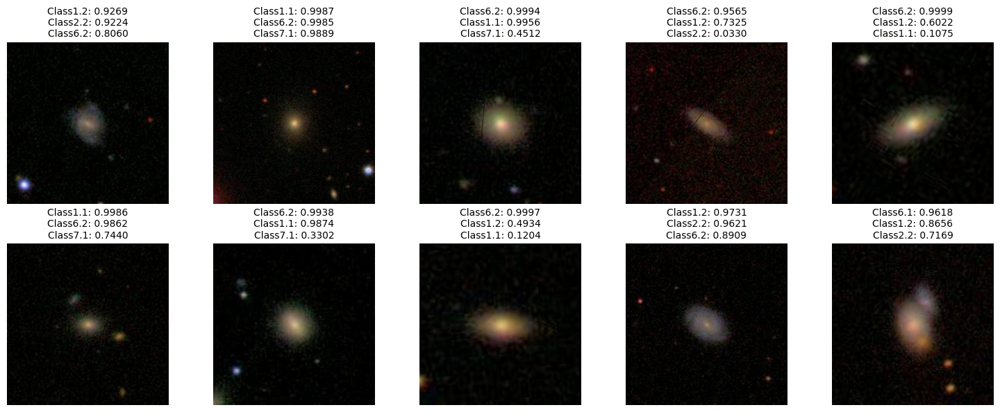

In [ ]:
test_directory = '/content/mlpa-final-project/images_test_rev1/'
model_path_6 = '/content/mlpa-final-project/models/galaxy_classification_model_Version7.keras'
display_images_with_predictions(test_directory, model_path_6, model = None, num_images=10)

## Trying out Nadam Optimizer


```
# This is formatted as code
```



In [ ]:
from tensorflow.keras.optimizers import Nadam
from tensorflow.keras.losses import binary_crossentropy

strategy = tf.distribute.MirroredStrategy()

# Repeat the train dataset indefinitely
train_ds_repeat = train_ds.repeat()

# Repeat the validation dataset indefinitely
val_ds_repeat = val_ds.repeat()

steps_per_epoch = 1450
validation_steps = 250



with strategy.scope():
  # Configure the optimizer with custom settings if needed
  nadam_optimizer = Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)
  model = load_model(model_path_6, compile=False)
  model.compile(loss=binary_crossentropy, optimizer=nadam_optimizer, metrics=['accuracy', root_mean_squared_error])
  model.fit(train_ds_repeat, steps_per_epoch=steps_per_epoch, epochs=30, validation_data=val_ds_repeat, validation_steps=validation_steps, verbose=1, callbacks=callbacks)

model.save('/content/mlpa-final-project/models/galaxy_classification_model_Version8.keras')

Epoch 1/30
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 118s 60ms/step - accuracy: 0.7246 - loss: 0.2692 - root_mean_squared_error: 0.1076 - val_accuracy: 0.7807 - val_loss: 0.2389 - val_root_mean_squared_error: 0.0924 - learning_rate: 0.0010
Epoch 2/30
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 85s 59ms/step - accuracy: 0.7711 - loss: 0.2391 - root_mean_squared_error: 0.0957 - val_accuracy: 0.7894 - val_loss: 0.2361 - val_root_mean_squared_error: 0.0913 - learning_rate: 0.0010
Epoch 3/30
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 85s 59ms/step - accuracy: 0.7736 - loss: 0.2385 - root_mean_squared_error: 0.0951 - val_accuracy: 0.7847 - val_loss: 0.2389 - val_root_mean_squared_error: 0.0953 - learning_rate: 0.0010
Epoch 4/30
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 86s 59ms/step - accuracy: 0.7763 - loss: 0.2387 - root_mean_squared_error: 0.0948 - val_accuracy: 0.7844 - val_loss: 0.2376 - val_root_mean_squared_error: 0.0910 - learning_rate: 0.0010
Epoch 5/30
1450/1450 ━━━━━━━━━━━━━━━━━━━━ 85s 59ms/step - accuracy: 0.7785 - loss: 0.23

In [ ]:
# Evaluate the model on the test dataset
model_path = '/content/mlpa-final-project/models/galaxy_classification_model_Version8.keras'

# Load the model
loaded_model = tf.keras.models.load_model(model_path, custom_objects={'root_mean_squared_error': root_mean_squared_error}, compile=False)

loaded_model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy',root_mean_squared_error])


# Evaluate the model on the test dataset
result = loaded_model.evaluate(test_ds)

# The result includes loss and other metrics that were used when compiling the model, such as accuracy
print("Test Loss:", result[0])
print("Test Accuracy:", result[1])
print("Test RMSE:", result[2])  # RMSE is the third metric

193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.7748 - loss: 0.2391 - root_mean_squared_error: 0.0930
Test Loss: 0.23903778195381165
Test Accuracy: 0.77931147813797
Test RMSE: 0.0933443158864975


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step


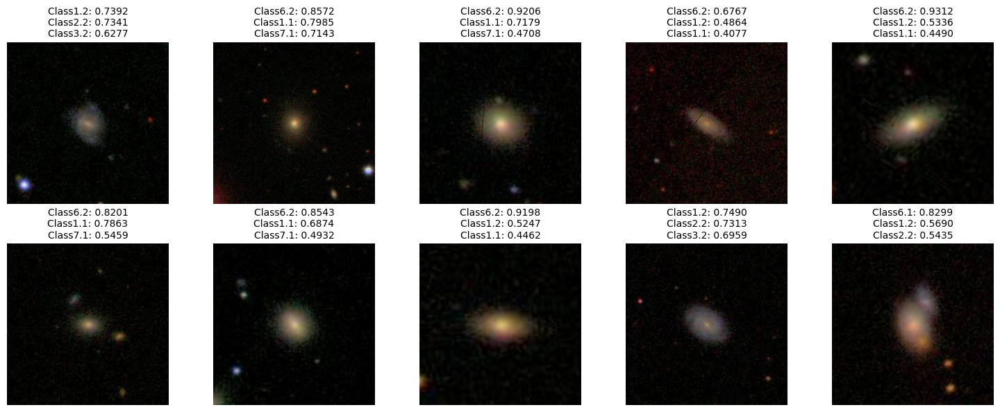

In [ ]:
test_directory = '/content/mlpa-final-project/images_test_rev1/'
model_path_6 = '/content/mlpa-final-project/models/galaxy_classification_model_Version8.keras'
display_images_with_predictions(test_directory, model_path_6, model = None, num_images=10)

In [ ]:
import json

galaxy_classification = {
    "Class 1": {
        "Question": "Is the galaxy smooth and rounded, with no sign of a disk?",
        "Responses": {
            "1.1": "Smooth",
            "1.2": "Features or disk",
            "1.3": "Star or artifact"
        }
    },
    "Class 2": {
        "Question": "Could this be a disk viewed edge-on?",
        "Responses": {
            "2.1": "Yes",
            "2.2": "No"
        }
    },
    "Class 3": {
        "Question": "Is there a sign of a bar feature through the center of the galaxy?",
        "Responses": {
            "3.1": "Yes",
            "3.2": "No"
        }
    },
    "Class 4": {
        "Question": "Is there any sign of a spiral arm pattern?",
        "Responses": {
            "4.1": "Yes",
            "4.2": "No"
        }
    },
    "Class 5": {
        "Question": "How prominent is the central bulge, compared with the rest of the galaxy?",
        "Responses": {
            "5.1": "No bulge",
            "5.2": "Just noticeable",
            "5.3": "Obvious",
            "5.4": "Dominant"
        }
    },
    "Class 6": {
        "Question": "Is there anything odd?",
        "Responses": {
            "6.1": "Yes",
            "6.2": "No"
        }
    },
    "Class 7": {
        "Question": "How rounded is it?",
        "Responses": {
            "7.1": "Completely round",
            "7.2": "In between",
            "7.3": "Cigar-shaped"
        }
    },
    "Class 8": {
        "Question": "Is the odd feature a ring, or is the galaxy disturbed or irregular?",
        "Responses": {
            "8.1": "Ring",
            "8.2": "Lens or arc",
            "8.3": "Disturbed",
            "8.4": "Irregular",
            "8.5": "Other",
            "8.6": "Merger",
            "8.7": "Dust lane"
        }
    },
    "Class 9": {
        "Question": "Does the galaxy have a bulge at its centre? If so, what shape?",
        "Responses": {
            "9.1": "Rounded",
            "9.2": "Boxy",
            "9.3": "No bulge"
        }
    },
    "Class 10": {
        "Question": "How tightly wound do the spiral arms appear?",
        "Responses": {
            "10.1": "Tight",
            "10.2": "Medium",
            "10.3": "Loose"
        }
    },
    "Class 11": {
        "Question": "How many spiral arms are there?",
        "Responses": {
            "11.1": "1",
            "11.2": "2",
            "11.3": "3",
            "11.4": "4",
            "11.5": "More than four",
            "11.6": "Can't tell"
        }
    }
}

print(json.dumps(galaxy_classification, indent=4))